The goal for this notebook is to cluster together (using shared word frequencies) the topics from the generated topic model. This will assist with:
+ Gaining another view on the overall model
+ Identifying associated topics with those that I have selected through interpretive measures

Few decision:
+ limit each topic to the top 100 words (per: https://web.archive.org/web/20150118123741/http://dh-r.lincolnmullen.com/topic-modeling.html) -> edit: clearer results with top 20 words.
+ smooth with the beta value and get weight within topic -> No smoothing for clearer results.
+ compute the pairwise distance between the topics and cluster. -> use plotly defaults for calculations.

In [1]:
import pandas as pd
import os

In [2]:
data_dir = "/Users/jeriwieringa/Dissertation/data/model_analysis/"

In [3]:
# tw_target... generated in 
tw = pd.read_csv(os.path.join(data_dir, 'tw_target_300_10.18497.csv'))

In [4]:
tw[:10]

,topic,type,word_counts
0,0,aad,2
1,0,aand,3
2,0,abegg,9
3,0,ability,53
4,0,able,1123
5,0,abrams,1
6,0,absent,45
7,0,abundant,41
8,0,abundantly,38
9,0,accepted,168


In [5]:
top_topic_words = tw.groupby('topic').apply(lambda x: x.nlargest(50, 'word_counts')).reset_index(drop=True)
top_topic_words[:10]

,topic,type,word_counts
0,0,book,36113
1,0,canvasser,16637
2,0,order,15259
3,0,canvassing,13014
4,0,brother,10430
5,0,week,9752
6,0,sold,9408
7,0,field,8662
8,0,agent,7780
9,0,report,7049


In [6]:
import json

with open(os.path.join(data_dir, 'params_target_300_10.18497.json')) as json_data:
    d = json.load(json_data)

beta = d['beta']

In [7]:
# Load Labels

import gspread
from oauth2client.service_account import ServiceAccountCredentials

# Load data from Google Doc
scope = ['https://spreadsheets.google.com/feeds']
secrets = "/Users/jeriwieringa/Dissertation/dev/code/secrets/dissertation-881847769b13.json"
credentials = ServiceAccountCredentials.from_json_keyfile_name(secrets, scope)
gc = gspread.authorize(credentials)
dts = gc.open('Topic Labels').sheet1

labels = pd.DataFrame(dts.get_all_records())

In [8]:
tw_matrix = pd.pivot_table(top_topic_words, 
                           index='topic', 
                           columns="type", 
                           values='word_counts', 
                           fill_value=0)

In [9]:
# tw_matrix_smooth = tw_matrix + beta
tw_matrix_normed = tw_matrix.div(tw_matrix.sum(axis=1), axis=0)

In [10]:
tw_matrix_normed[:2]

type,aaron,abdomen,abdominal,abel,ability,able,abolished,abraham,abram,academia,...,yes,york,young,young_girl,young_man,young_people,young_woman,youth,zealand,zion
topic,,,,,,,,,,,,,,,,,,,,,
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [11]:
tw_matrix_normed.sum(axis=1)[:2]

topic
0    1.0
1    1.0
dtype: float64

compute distance between the rows in the matrix

In [12]:
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go
import plotly.figure_factory as ff

import cufflinks as cf

init_notebook_mode(connected=True)
cf.go_offline()

In [13]:
labels[:3]

,browser_topic_id,mallet_topic_id,topic_category,topic_label,topic_prevalence_overall,topic_words
0,1,0,missions,Missions (Canvassing Work),0.02981,book canvasser order canvassing brother week s...
1,2,1,nutrition,Nutrition (Recipes),0.00927,cup water bread egg add cream salt flour milk ...
2,3,2,scan_errors,Scan Errors (OCR Errors),0.03660,ing tion ment sign ness com ter tions great en...


In [14]:
labels['topic_name'] = labels[['mallet_topic_id', 'topic_label']].apply(lambda x: ': '.join(x.astype(str)), axis=1)
labels[:3]

,browser_topic_id,mallet_topic_id,topic_category,topic_label,topic_prevalence_overall,topic_words,topic_name
0,1,0,missions,Missions (Canvassing Work),0.02981,book canvasser order canvassing brother week s...,0: Missions (Canvassing Work)
1,2,1,nutrition,Nutrition (Recipes),0.00927,cup water bread egg add cream salt flour milk ...,1: Nutrition (Recipes)
2,3,2,scan_errors,Scan Errors (OCR Errors),0.03660,ing tion ment sign ness com ter tions great en...,2: Scan Errors (OCR Errors)


In [15]:
topic_names = list(labels['topic_name'].values)

In [16]:
fig = ff.create_dendrogram(tw_matrix_normed, 
                           orientation='left', 
                           labels=topic_names,
                          )

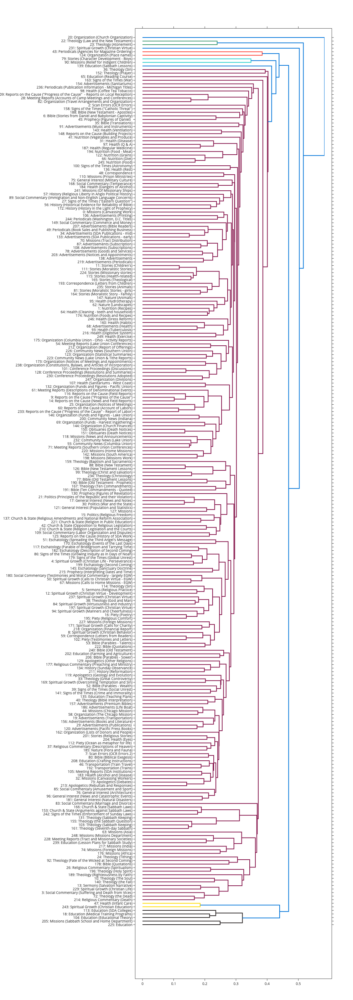

In [17]:
fig['layout'].update({'width':1600, 'height':2800, 
                      'margin':{'l':400, 'pad':20},
                      'font':{'size':10}
                     })

iplot(fig)

In [18]:
vizDir = "/Users/jeriwieringa/Dissertation/site/files/interact/"
plot(fig, filename=os.path.join(vizDir, 'topicDendrogram.html'))

'file:///Users/jeriwieringa/Dissertation/site/files/interact/topicDendrogram.html'